# OpenCV Uses

In [ ]:
!wget "https://github.com/shafayat1004/OpenCV-Practice/raw/master/images/images.zip"
!unzip "images.zip"


## Making Functions

In [78]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
from skimage import exposure


def BGR2RGB(img):
    return cv.cvtColor(img, cv.COLOR_BGR2RGB)
def GRAY2RGB(img):
    return cv.cvtColor(img, cv.COLOR_GRAY2RGB)    

def pltShowOne(img, caption="image", show=False, hideAxis=False, figNum = 0, figsize = None, dpi=100):
    RGB_img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

    if figsize != None:
        plt.figure(num=figNum, figsize=figsize, dpi=dpi)

    plt.title(caption)
    
    if hideAxis:
        ax = plt.gca()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.imshow(RGB_img)
    if show != False:
        plt.show()
        
def pltShow(images, titles, figNum=0, subplot=(1,1), figsize=(9,9), dpi=100, hideAxis=False, show=True):
    if subplot[0]*subplot[1] < len(images):
        print("Not Enough Space for all images, please increase subplot space")
        return
    if figNum != -1:
        plt.figure(num=figNum, figsize=figsize, dpi=dpi)
        
    for i, j, k in zip(images, titles, range(len(images))):
        plt.subplot(subplot[0],subplot[1],k+1)
        RGB_img = cv.cvtColor(i, cv.COLOR_BGR2RGB)
        plt.margins(0)
        plt.title(j)
    
        if hideAxis:
            ax = plt.gca()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
        plt.imshow(RGB_img)
        
    if show == True:
        plt.tight_layout()
        plt.show()


def pltHist(images, titles, figNum=0, subplot=(1,1), colors=('b','g','r'), masks=None, figsize=(7,7), dpi=100, show=True):
    if subplot[0]*subplot[1] < len(images):
        print("Not Enough Space for all images, please increase subplot space")
        return
    plt.figure(num=figNum, figsize=figsize, dpi=dpi)

    for i, j, k in zip(images, titles, range(len(images))):
        plt.subplot(subplot[0],subplot[1],k+1)
        if masks != None:
            if masks[k] != None:
                maskSection = masks[k]
                mask = np.zeros(i.shape[:2], np.uint8)
                mask[maskSection[0]:maskSection[1], maskSection[2]:maskSection[3]] = 255
                masked_img = cv.bitwise_and(i,i,mask = mask)
        else:
            mask=None

        if len(i.shape)==2:
            colors = ("k")

        plt.title(j)
        for l,col in enumerate(colors):
            histr = cv.calcHist(images=[i],channels=[l],mask=mask,histSize=[256],ranges=[0,256])
            plt.plot(histr,color = col)
            plt.xlim([0,256])
    if show == True:
        plt.show()

def plotProfile(image, gradient, intercept, title="Intensity Profile", spacing = 1, figsize=(15,4), xTickFrequency=2):
    xVals = np.arange(0, image.shape[1], step=spacing)
    yVals = gradient*xVals + intercept
    pixels = []
    pixelStrings = []
    for x, y in zip(xVals, yVals):
        if y<image.shape[0]:
            pixels.append((y, x))
            pixelStrings.append(f"({y},{x})")


    vals = [image[y][x] for y, x in pixels]
    plt.figure(figsize=figsize)
    plt.title(title)
    plt.xlabel("Pixels")
    plt.ylabel("Intensity")
    plt.xticks(np.arange(0,len(pixelStrings), step=xTickFrequency), pixelStrings[::xTickFrequency], rotation=90)
    plt.margins(0)
    plt.plot(pixelStrings, vals)

def getChannel(image, channel):
    zeros = np.zeros(image.shape[:2], dtype="uint8")
    splittedChannels = cv.split(image)

    if channel == "R":
        return cv.merge([zeros, zeros, splittedChannels[2]])
    elif channel == "G":
        return cv.merge([zeros, splittedChannels[1], zeros])
    elif channel == "B":
        return cv.merge([splittedChannels[0], zeros, zeros])
    else:
        return None


def getAllChannels(image):
    zeros = np.zeros(image.shape[:2], dtype="uint8")
    splittedChannels = cv.split(image)

    return cv.merge([zeros, zeros, splittedChannels[2]]), cv.merge([zeros, splittedChannels[1], zeros]), cv.merge([splittedChannels[0], zeros, zeros])


def whos(variable):
    %whos -o {type(variable).__name__}

def checkChannel(image, name='the image'):
    if len(image.shape) == 3 and image.shape[-1] == 3:
        sum0 = np.sum(image[:,:,0] - image[:,:,1])
        sum1 = np.sum(image[:,:,0] - image[:,:,2])
        sum2 = np.sum(image[:,:,1] - image[:,:,2])
        if sum0 + sum1 + sum2 == 0:
            print(f"All channels of {name} are identical")
        else:
            print(f"All channels of {name} are not identical")
    else:
        print(f"All channels of {name} are not identical")


def channelCount(img):
    return 1 if len(img.shape) == 2 else img.shape[-1]
    

def bitdepth(img):
    if img.dtype == "uint8":
        return 8 * channelCount(img)
    elif img.dtype == "uint16":
        return 16 * channelCount(img)
    elif img.dtype == "uint32":
        return 32 * channelCount(img)
    elif img.dtype == "uint64":
        return 64 * channelCount(img)
    else:
        return np.nan


def rotate_image(image, angle):
    image_center = tuple(np.array(image.shape[1::-1]) / 2)
    rot_mat = cv.getRotationMatrix2D(image_center, angle, 1.0)
    result = cv.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv.INTER_LINEAR)
    return result


def brightnessContrastAdjust(img, brightness, contrast):
    img = np.int16(img)
    img = img * (contrast/127+1) - contrast + brightness
    img = np.clip(img, 0, 255)
    return np.uint8(img)


def rescaleFrame(frame, scale=0.75):    #Applicable for all media 
    width = int(frame.shape[1] * scale)
    height = int(frame.shape[0] * scale)
    dimensions = (width, height)
    return cv.resize(frame, dimensions, interpolation=cv.INTER_AREA)
def changeRes(width, height):   #Only applicable for Live Video
    capture.set(3, width)
    capture.set(4, height)




def logTransform(image):
    floatImg = image.astype(np.float64)
    transformedImage = np.log(1+floatImg)
    normalized_image = (transformedImage*(255/np.max(transformedImage))).astype(np.uint8)
    return normalized_image


def powerLawTransform(image, gamma=1.0):
    floatImg = image.astype(np.float64)/255
    return (np.power(floatImg, (1/gamma))*255).astype(np.uint8)


def contrastStretch(image, k, E):
    floatImg = image.astype(np.float64)/255
    onePluskByrpowE = 1 + np.power((k/(floatImg+1/255)), E)
    transformedImage = 1/onePluskByrpowE
    normalizedImage = (transformedImage*(255/np.max(transformedImage))).astype(np.uint8)
    return normalizedImage    

## 1. Loading a Grayscale and Color Image

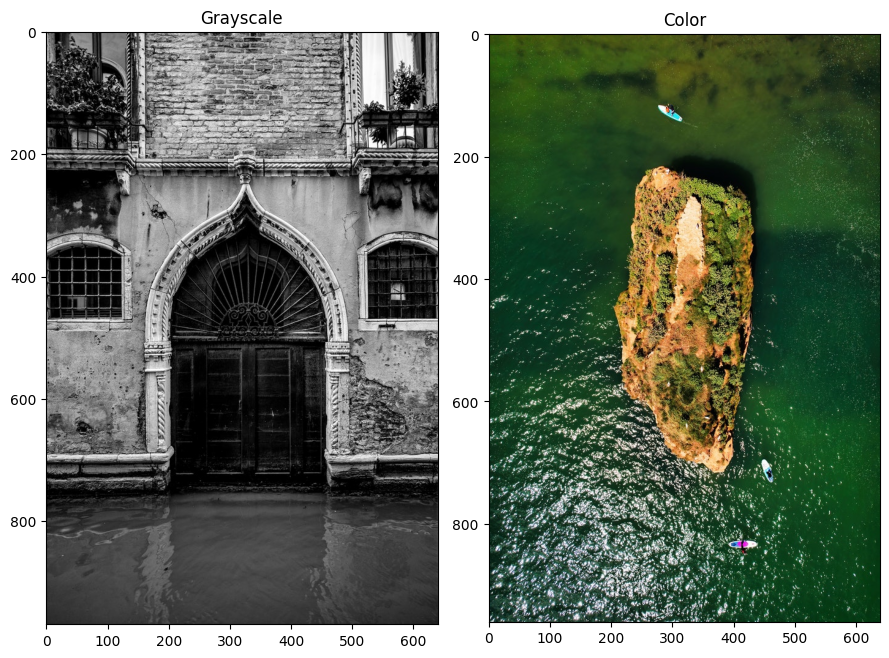

In [48]:
grayBGR = cv.imread("images/gray.jpg")
gray = cv.cvtColor(grayBGR, code=cv.COLOR_BGR2GRAY)
color = cv.imread("images/color.jpg")

pltShow(images=[gray, color], titles=["Grayscale", "Color"], figNum=1, subplot=(1,2))



## 2. Finding Data Type of Images

In [49]:
print(color.dtype)
print(gray.dtype)

uint8
uint8


## 3. Finding Bit Depth of Images

In [50]:
print(f"Bitdepth of grayBGR = {bitdepth(grayBGR)}")
print(f"Bitdepth of gray = {bitdepth(gray)}")
print(f"Bitdepth of color = {bitdepth(color)}")

Bitdepth of grayBGR = 24
Bitdepth of gray = 8
Bitdepth of color = 24


## 4. Finding number of pixels in image

In [51]:
print(f"Grayscale Image : {gray.shape[0]} x {gray.shape[1]} pixels")
print(f"Color Image : {color.shape[0]} x {color.shape[1]} pixels")

Grayscale Image : 969 x 640 pixels
Color Image : 961 x 640 pixels


## 5. Splitting the channels of color image

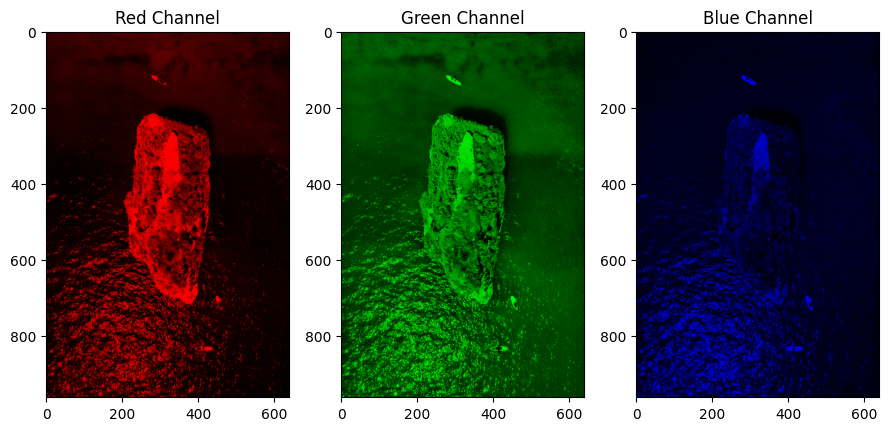

In [52]:
images = getAllChannels(color)
titles = ["Red Channel", "Green Channel", "Blue Channel"]

pltShow(images, titles, 2, (1,3))

## 6. Image Thresholding

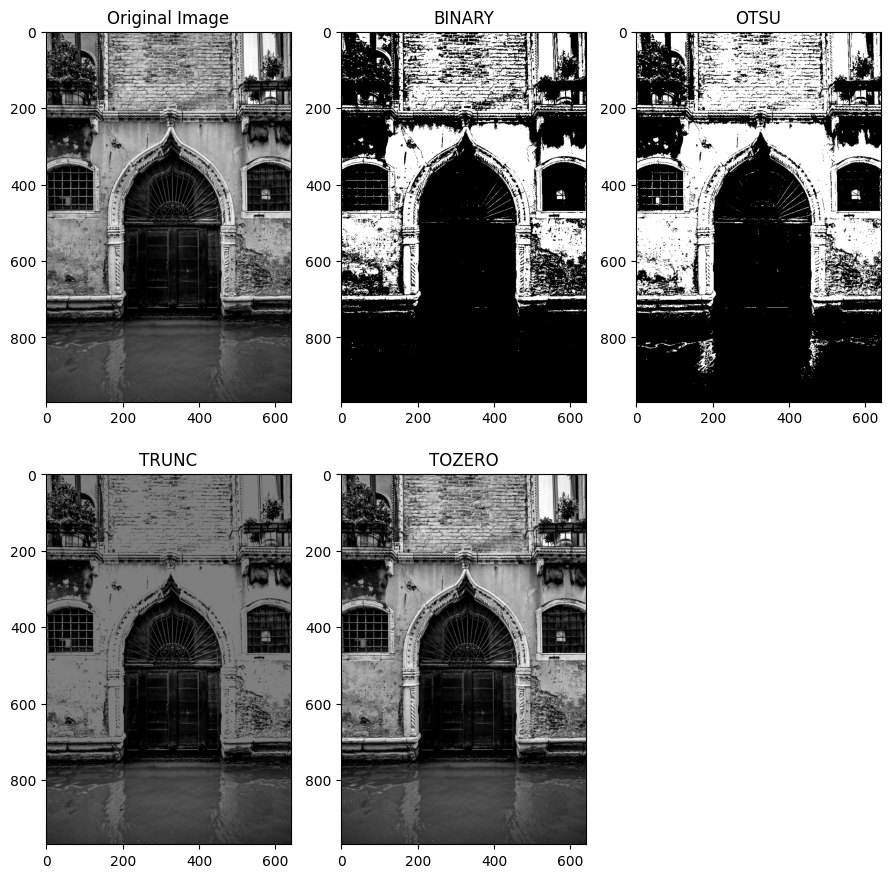

In [53]:
ret,thresh1 = cv.threshold(gray,127,255,cv.THRESH_BINARY)
ret,thresh2 = cv.threshold(gray,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
ret,thresh3 = cv.threshold(gray,127,255,cv.THRESH_TRUNC)
ret,thresh4 = cv.threshold(gray,0,255,cv.THRESH_TOZERO)
titles = ['Original Image','BINARY','OTSU','TRUNC','TOZERO']
images = [gray, thresh1, thresh2, thresh3, thresh4]
    
pltShow(images, titles, 3, subplot=(2,3))            



## 7. OpenCV Builtin Lookup Tables

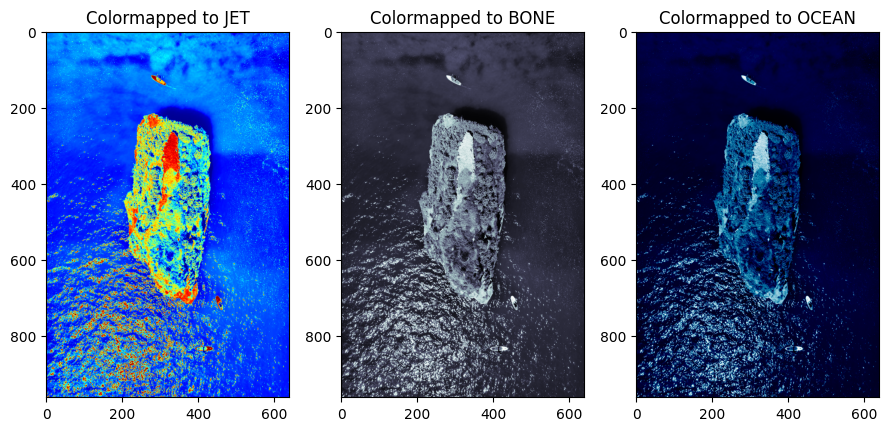

In [54]:
colormapped2JET = cv.applyColorMap(color, colormap=cv.COLORMAP_JET)
colormapped2BONE = cv.applyColorMap(color, colormap=cv.COLORMAP_BONE)
colormapped2OCEAN = cv.applyColorMap(color, colormap=cv.COLORMAP_OCEAN)
images = [colormapped2JET, colormapped2BONE, colormapped2OCEAN]
titles = ["Colormapped to JET", "Colormapped to BONE", "Colormapped to OCEAN"]
pltShow(images, titles, 4, (1,3))

## 8. Inspecting Variables

In [55]:
whos(gray)

Variable              Type       Data/Info
------------------------------------------
afterGamma0_5         ndarray    576x1024: 589824 elems, type `uint8`, 589824 bytes (576.0 kb)
afterGamma1_5         ndarray    576x1024: 589824 elems, type `uint8`, 589824 bytes (576.0 kb)
afterGamma2_0         ndarray    576x1024: 589824 elems, type `uint8`, 589824 bytes (576.0 kb)
afterGamma2_5         ndarray    576x1024: 589824 elems, type `uint8`, 589824 bytes (576.0 kb)
afterGamma3_5         ndarray    576x1024: 589824 elems, type `uint8`, 589824 bytes (576.0 kb)
afterStrech           ndarray    576x1024: 589824 elems, type `uint8`, 589824 bytes (576.0 kb)
blankCanvas           ndarray    800x800x3: 1920000 elems, type `uint8`, 1920000 bytes (1.8310546875 Mb)
blurred               ndarray    961x640x3: 1845120 elems, type `uint8`, 1845120 bytes (1.7596435546875 Mb)
bothaxisMirrorColor   ndarray    961x640x3: 1845120 elems, type `uint8`, 1845120 bytes (1.7596435546875 Mb)
canny                 n

## 9. Accessing Different Channels using NumPy

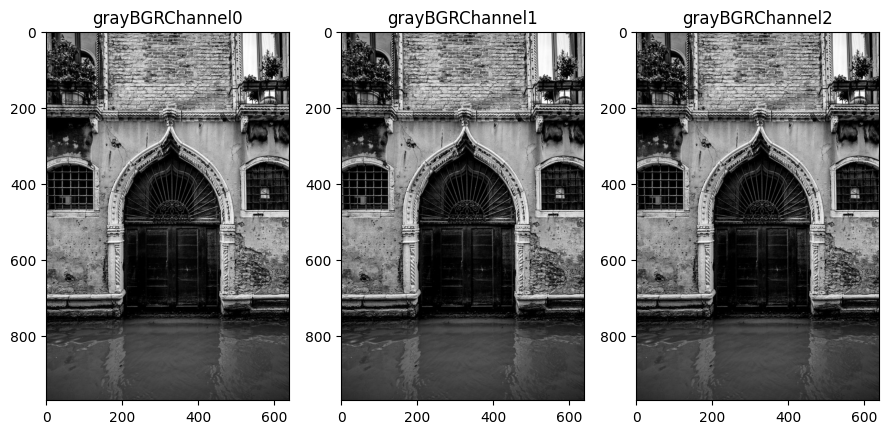

In [56]:
grayBGRChannel0 = grayBGR[:,:,0]
grayBGRChannel1 = grayBGR[:,:,1]
grayBGRChannel2 = grayBGR[:,:,2]

images = [grayBGRChannel0, grayBGRChannel1, grayBGRChannel2]
titles = ["grayBGRChannel0", "grayBGRChannel1", "grayBGRChannel2"]

pltShow(images ,titles, 5, (1,3))

## 10. Checking if Channels are identical

In [57]:
print(f"Shape of grayBGR is {grayBGR.shape}")
checkChannel(grayBGR , "grayBGR")
graySame = cv.merge([grayBGRChannel0, grayBGRChannel0, grayBGRChannel0])
print(f"Shape of graySame is {graySame.shape}")
checkChannel(graySame, "graySame")

Shape of grayBGR is (969, 640, 3)
All channels of grayBGR are not identical
Shape of graySame is (969, 640, 3)
All channels of graySame are identical


## 12. Calculating how big a pixel is in real life

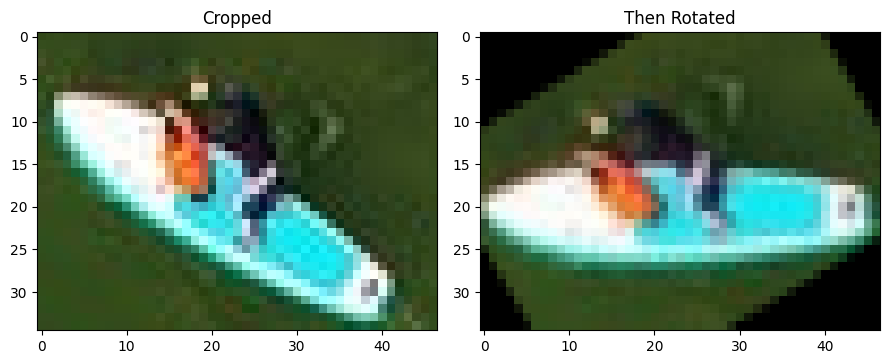

In [58]:
colorCropped = color[109:144, 274:321]
colorCroppedRotated = rotate_image(colorCropped, 31)
pltShow(images=[colorCropped, colorCroppedRotated], titles=["Cropped", "Then Rotated"], figNum=6, subplot=(1,2))

A two person Kayak is typically 370cm, therefore $\frac{370}{321-274}=7.8$ cm/pixel

## 13. Contrast Adjustment


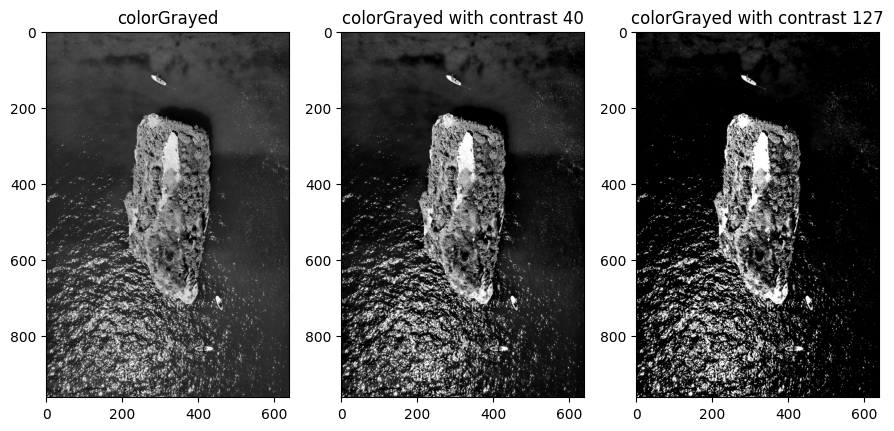

In [59]:
colorGrayed = cv.cvtColor(color, cv.COLOR_BGR2GRAY)
colorContrast40 = brightnessContrastAdjust(colorGrayed, 0, 40)
colorContrast127 = brightnessContrastAdjust(colorGrayed, 0, 127)


images = [colorGrayed, colorContrast40, colorContrast127]
titles = ["colorGrayed", "colorGrayed with contrast 40", "colorGrayed with contrast 127"]
pltShow(images, titles, figNum=7, subplot=(1,3))
    

## 14. Inverting a Grayscale Image

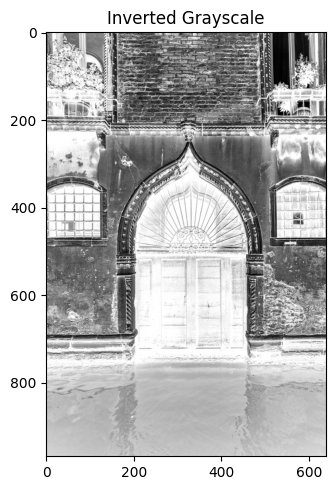

In [60]:
invertedGray = cv.bitwise_not(gray)
pltShow([invertedGray], ["Inverted Grayscale"], figNum=8, figsize=(5,5))

## 15. Flipping an Image

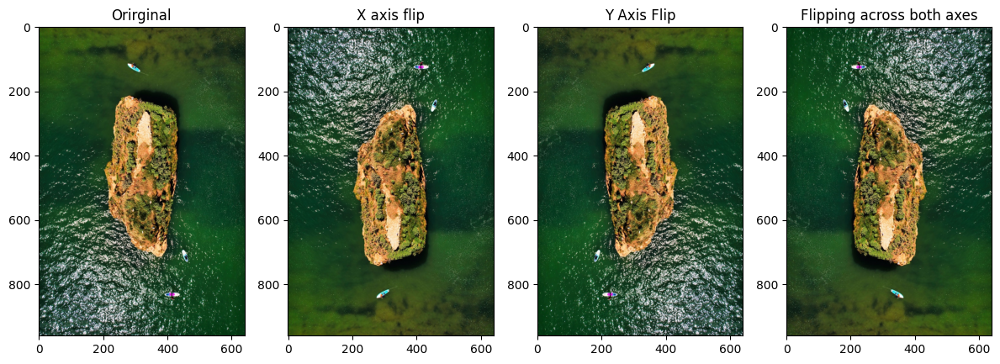

In [61]:
xaxisMirrorColor = cv.flip(color, 0)
yaxisMirrorColor = cv.flip(color, 1)
bothaxisMirrorColor = cv.flip(color, -1)
images = [color, xaxisMirrorColor, yaxisMirrorColor, bothaxisMirrorColor]
titles = ["Orirginal", "X axis flip", "Y Axis Flip", "Flipping across both axes"]

pltShow(images, titles, figNum=9, subplot=(1,4), figsize=(12,12))


## 16. Rotating an Image

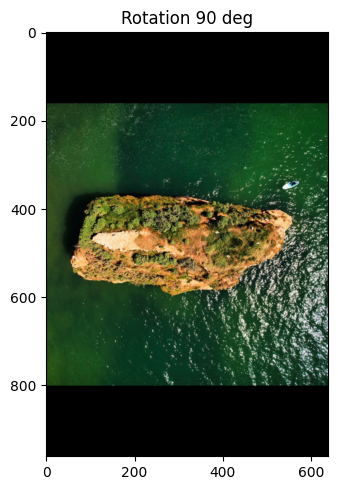

In [62]:
rotated = rotate_image(color, 90)
pltShow([rotated], ["Rotation 90 deg"], figNum=10, figsize=(5,5))

## 17. Plotting Intensity Profile Based On a Mathematical Line

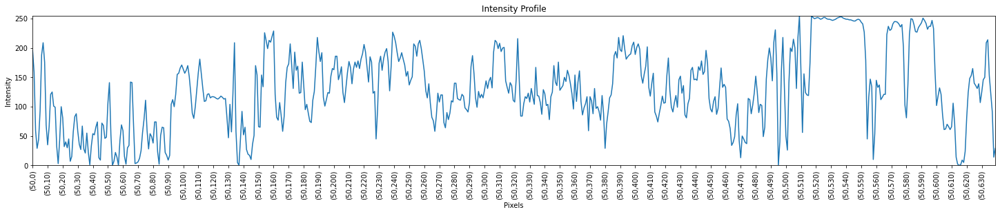

In [63]:
plotProfile(gray, gradient=0, intercept=50, spacing=1, figsize=(25,4), xTickFrequency=10)
    

## 18. Drawing

In [64]:
blankCanvas = np.zeros((800,800,3), dtype='uint8')

blankCanvas[:] = 255,0,0 #B, G, R
blankCanvas[200:300,300:400] = 255,255,0 # From row 200 to 300 and Col 300 to 400, Cyan

cv.rectangle(blankCanvas, (0,0), (blankCanvas.shape[1]//2, blankCanvas.shape[0]//2), (0,255,255), thickness=cv.FILLED)

radius = 100
cv.circle(blankCanvas, (blankCanvas.shape[1]//2, blankCanvas.shape[0]//2), radius, (0,0,255), thickness=-1)

cv.line(blankCanvas, (blankCanvas.shape[1]//2 + int(radius/(np.sqrt(2))), blankCanvas.shape[0]//2 + int(radius/(np.sqrt(2)))), (blankCanvas.shape[1], blankCanvas.shape[0]), (0,255,0), thickness=3)

cv.putText(blankCanvas, "Hello This Is OpenCV!", (blankCanvas.shape[1]//2, blankCanvas.shape[0]//2), cv.FONT_HERSHEY_TRIPLEX, 1.0, (0,120,120), thickness=1)

pltShow(blankCanvas,"blank", figsize=(5,5))

Not Enough Space for all images, please increase subplot space


## 19. Blurring

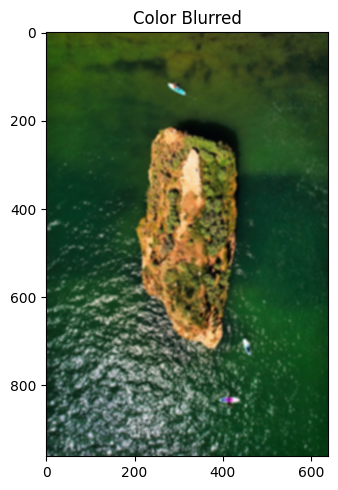

In [65]:
blurred = cv.GaussianBlur(color, ksize=(7,7), sigmaX=cv.BORDER_DEFAULT)
pltShow([blurred], ["Color Blurred"], figNum=11, figsize=(5,5))

## 20. Edge Cascade (Outlining Edges)

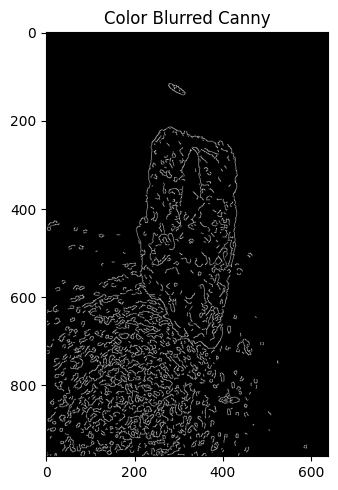

In [66]:
canny = cv.Canny(blurred, threshold1=125, threshold2=175)
pltShow([canny], ["Color Blurred Canny"], figNum=12, figsize=(5,5))


## 21. Dilating an Image (Make Lines Thicker)

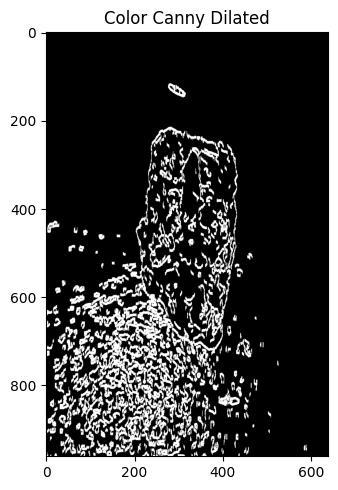

In [67]:
dilated = cv.dilate(canny, kernel=(9,9), iterations=5)
pltShow([dilated], ["Color Canny Dilated"], figNum=13, figsize=(5,5))

## 22. Eroding (Make lines thinner)

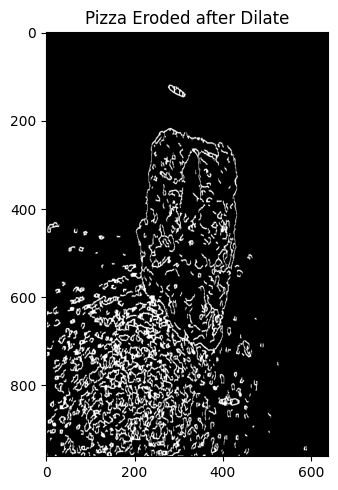

In [68]:
eroded = cv.erode(dilated, kernel=(9,9), iterations=3)
pltShow([eroded], ["Pizza Eroded after Dilate"], figNum=14, figsize=(5,5))

## 23. Resizing

In [69]:
# resized_INTER_AREA = cv.resize(color, (1000,1000), interpolation=cv.INTER_AREA)     # For Shrinking (cv.INTER_AREA)
# resized_INTER_LINEAR = cv.resize(color, (1000,1000), interpolation=cv.INTER_LINEAR)   # For Enlarging (cv.INTER_LINEAR) [faster/lower quality]
# resized_INTER_CUBIC = cv.resize(color, (1000,1000), interpolation=cv.INTER_CUBIC)    # For Shrinking (cv.INTER_CUBIC)  [slower/ higher quality]
# cv.imshow("Pizza resized_INTER_AREA", resized_INTER_AREA)
# cv.imshow("Pizza resized_INTER_LINEAR", resized_INTER_LINEAR)
# cv.imshow("Pizza resized_INTER_CUBIC", resized_INTER_CUBIC)
# cv.imshow("Original", color)

# cv.waitKey(0)
# cv.destroyAllWindows()

## 24. Video Capture

In [70]:
# capture = cv.VideoCapture(0)
# # changeRes(1280,720)
# while True:
#     isTrue, frame = capture.read()

#     # frameResized = rescaleFrame(frame, scale=2)
#     # cv.imshow('Video', frameResized)
#     cv.imshow('Video', frame)
#     if cv.waitKey(20) & 0xFF==ord('d'):
#         break
# capture.release()
# cv.destroyAllWindows()

## 25. Plotting Histogram

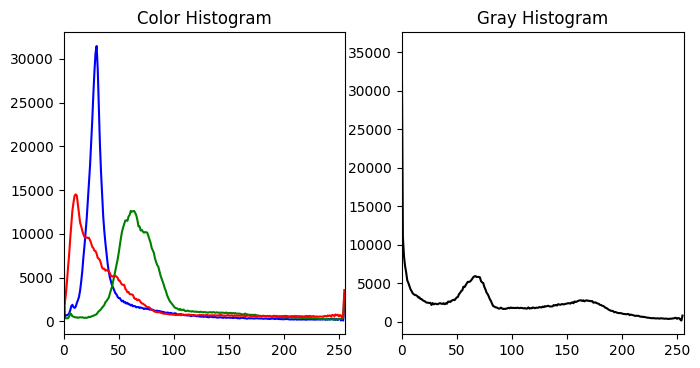

In [71]:
pltHist([color, gray], ["Color Histogram", "Gray Histogram"], figNum=15, subplot=(1,2), figsize=(8,4))

## 26. Histogram Equalization

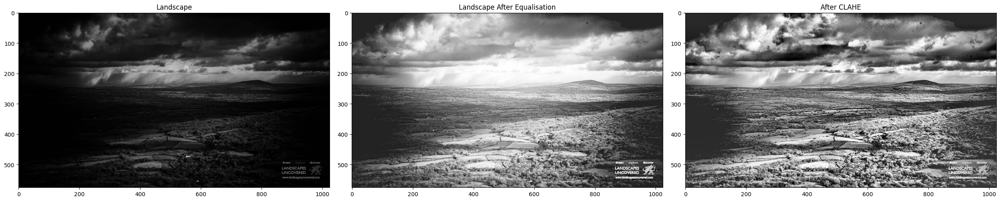

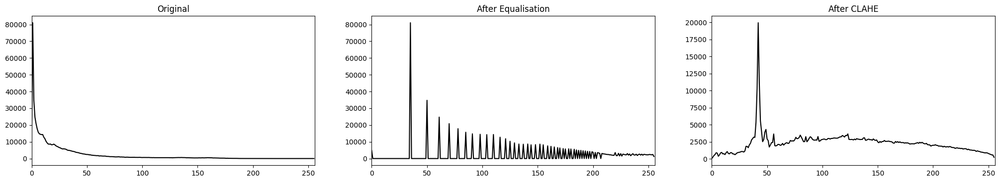

In [72]:
landscape = cv.imread('images/darkLandscape.jpg', cv.IMREAD_GRAYSCALE)
landscapeHEQ = cv.equalizeHist(landscape)
clahe = cv.createCLAHE(clipLimit=40.0, tileGridSize=(8,8))
landscapeCLAHE = clahe.apply(landscape)

pltShow(images=[landscape, landscapeHEQ, landscapeCLAHE], titles=["Landscape", "Landscape After Equalisation", "After CLAHE"], figNum=16, subplot=(1,3), figsize=(25,20))
pltHist([landscape, landscapeHEQ, landscapeCLAHE], ["Original", "After Equalisation", "After CLAHE"], figNum = 17, subplot=(1,3), figsize=(25,4))

## 27. Histogram matching

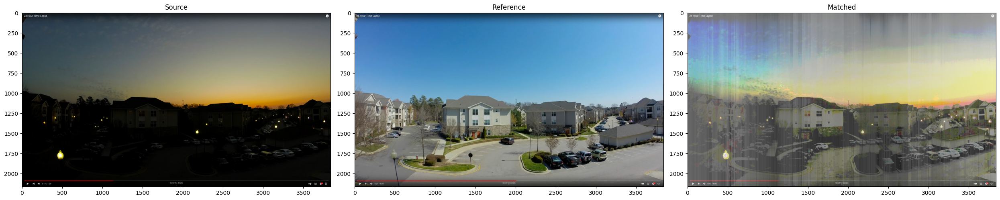

In [73]:
darkShot = cv.imread("images/footage-dark.png")
ref = cv.imread("images/footage-light.png")
multi = True if darkShot.shape[-1] > 1 else False
matched = exposure.match_histograms(darkShot, ref, channel_axis=multi)

pltShow([darkShot, ref, matched], ["Source", "Reference", "Matched"], figNum=18, subplot=(1,3), figsize=(25,20))


## 28. Manipulation of Dynamic Range
### Logarithmic Transformation

In [74]:
output = logTransform(landscape)

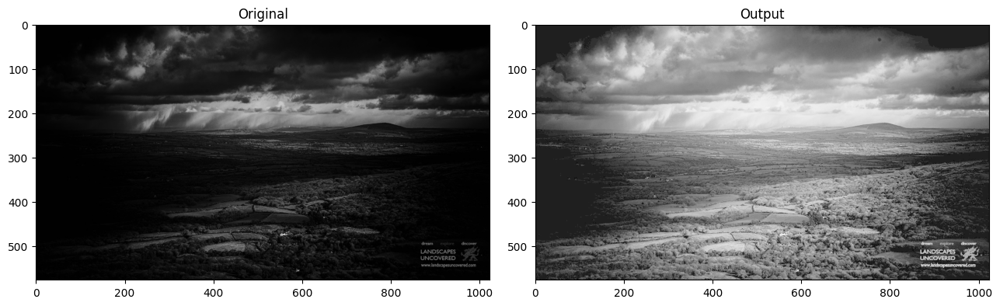

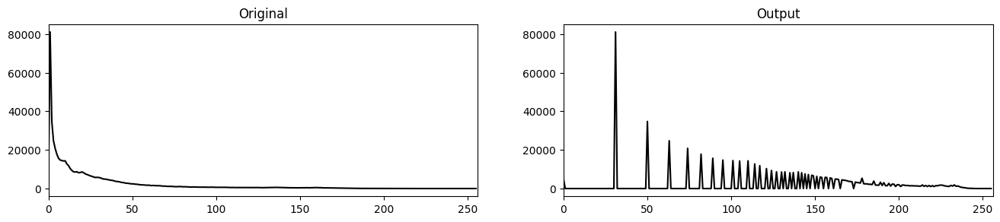

In [75]:
pltShow([landscape, output], ["Original", "Output"], figNum=19, subplot=(1,2), figsize=(13,8))
pltHist([landscape, output], ["Original", "Output"], figNum=20, subplot=(1,2), figsize=(16,3))

### Gamma Transformation

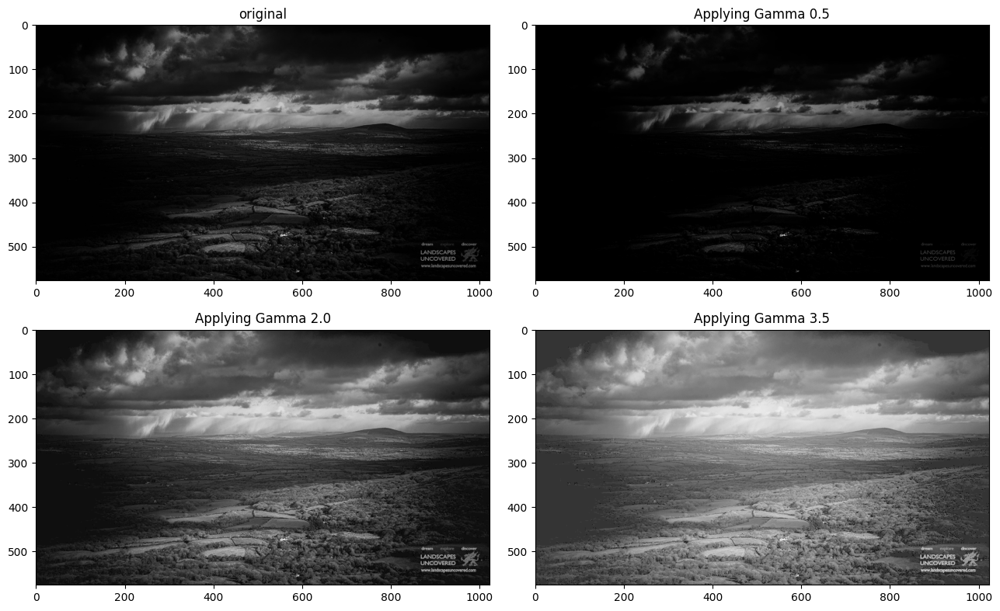

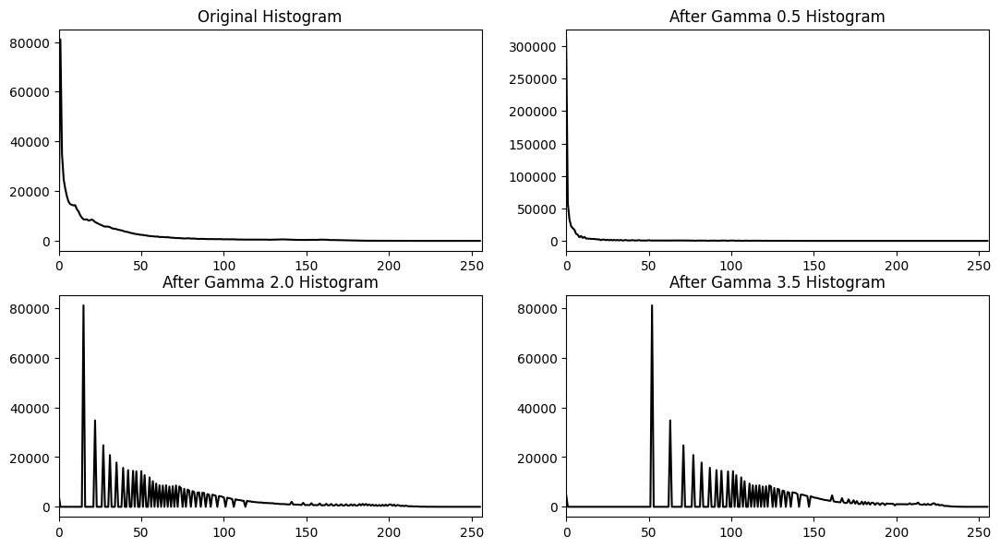

In [76]:
afterGamma0_5 = powerLawTransform(landscape, 0.5)
afterGamma2_0 = powerLawTransform(landscape, 2.0)
afterGamma3_5 = powerLawTransform(landscape, 3.5)

images = [landscape, afterGamma0_5, afterGamma2_0, afterGamma3_5]
titles = ["original", "Applying Gamma 0.5", "Applying Gamma 2.0", "Applying Gamma 3.5"]
titlesHist = ["Original Histogram", "After Gamma 0.5 Histogram", "After Gamma 2.0 Histogram", "After Gamma 3.5 Histogram"]

pltShow(images, titles, figNum=2, subplot=(2,2), figsize=(13,8))
pltHist(images, titlesHist, subplot=(2,2), figNum=3, figsize=(13,7))

### Contrast Stretching

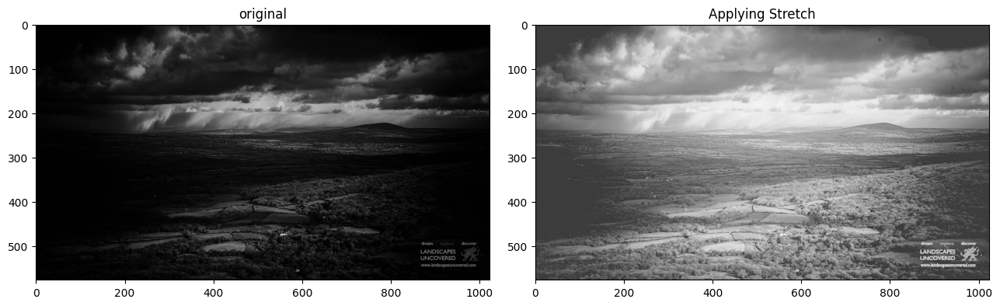

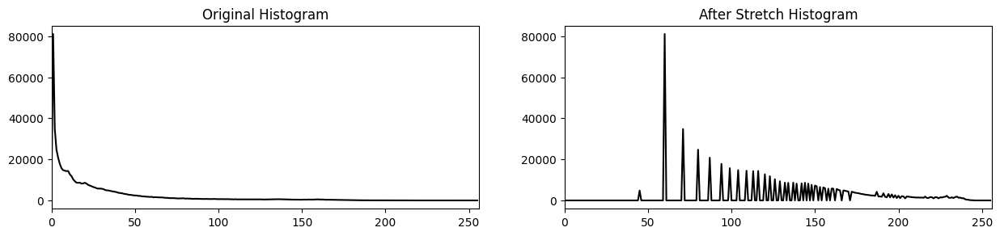

In [79]:
afterStretch = contrastStretch(landscape, 0.2, 0.5)
pltShow([landscape, afterStretch], ["original","Applying Stretch"], figNum=4, subplot=(1,2), figsize=(13,8))
pltHist([landscape, afterStretch], ["Original Histogram", "After Stretch Histogram"], subplot=(1,2), figNum=5, figsize=(15,3))